In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import tensorflow as tf
import functools
from matplotlib import pyplot as plt
import os
# os.environ["CUDA_VISIBLE_DEVICES"]="1"

from gantools import utils, plot, data, evaluation, blocks
from gantools.gansystem import GANsystem, UpcaleGANsystem
from gantools.model import WGAN, UpscalePatchWGAN, CosmoWGAN



Instructions for updating:
Use the retry module or similar alternatives.


In [3]:
# Setting the forward and backward transform

def non_lin(x):
    return (tf.nn.tanh(x) + 1.0)/2.0
ns = 32
num_samples = 32

pathmodel = '../saved_results/medical'
pathsample = '../samples/medical'

In [4]:
def plot_cubes_paper(cubes, slice_num=None, nx=2, ny=2, **kwargs):
    if len(cubes)<nx*ny:
        raise ValueError("Not enough samples.")
    if slice_num is None:
        slice_num = cubes.shape[1]//2+4
    fig, ax = plt.subplots(nx, ny, sharey=True,figsize=(11/2*ny,10.5/2*nx))
    sn = 0
    for i in range(nx):
        for j in range(ny):
            if nx==1 and ny==1:
                tax = ax
            elif nx==1:
                tax = ax[j]
            elif ny==1:
                tax = ax[i]
            else:
                tax = ax[i,j]
            tax.imshow(cubes[sn,slice_num], interpolation='none', **kwargs)
            tax.axis('off')
            sn += 1
    plt.tight_layout()

    return fig

# Generate samples - 32->64->256

## 0->32

In [76]:
name = 'WGAN_0_to_32_checkpoints'
checkpoint = None

pathmodel32 = os.path.join(pathmodel, name)
params_32 = utils.load_params(pathmodel32)


In [77]:
wgan_32 = GANsystem(CosmoWGAN,params_32, name='wgan')

Generator 
--------------------------------------------------
     The input is of size (?, 100)
     0 Full layer with 32768 outputs
         Size of the variables: (?, 32768)
     Reshape to (?, 4, 4, 4, 512)
     1 Deconv layer with 256 channels
         Non linearity applied
         Size of the variables: (?, 8, 8, 8, 256)
     2 Deconv layer with 128 channels
         Non linearity applied
         Size of the variables: (?, 16, 16, 16, 128)
     3 Deconv layer with 64 channels
         Non linearity applied
         Size of the variables: (?, 32, 32, 32, 64)
     4 Deconv layer with 64 channels
         Non linearity applied
         Size of the variables: (?, 32, 32, 32, 64)
     5 Deconv layer with 1 channels
         Size of the variables: (?, 32, 32, 32, 1)
     The output is of size (?, 32, 32, 32, 1)
--------------------------------------------------

Discriminator 
--------------------------------------------------
     The input is of size (?, 32, 32, 32, 1)
Warning spec

In [78]:
gen_samples_32 = wgan_32.generate(N=num_samples, checkpoint=checkpoint)
gen_samples_32 = np.squeeze(gen_samples_32)

Sampling z
 [*] Reading checkpoints...
INFO:tensorflow:Restoring parameters from ../saved_results/medical/WGAN_0_to_32_checkpoints/wgan-47000
Checkpoint succesfully loaded!


In [79]:
os.makedirs(os.path.join(pathsample,'0_32/'), exist_ok=True)
utils.save_hdf5(gen_samples_32, os.path.join(pathsample,'0_32/32_samples_ckpt_latest.h5'))

## 32->64

Load fake 32

In [80]:
gen_samples_32 = utils.load_hdf5(os.path.join(pathsample,'0_32/32_samples_ckpt_latest.h5'))[:num_samples]
print("gen_samples_32 shape=", gen_samples_32.shape)
gen_samples_32 = np.expand_dims(gen_samples_32, axis=4)
print('downsampled shape=', gen_samples_32.shape)

gen_samples_32 shape= (32, 32, 32, 32)
downsampled shape= (32, 32, 32, 32, 1)


In [81]:
name = 'WGAN_32_to_64_checkpoints'
checkpoint64 = None
class CosmoUpscalePatchWGAN(UpscalePatchWGAN, CosmoWGAN):
    pass

pathmodel64 = os.path.join(pathmodel, name)
params_64 = utils.load_params(pathmodel64)


In [82]:
wgan_64 = UpcaleGANsystem(CosmoUpscalePatchWGAN, params_64)
gen_samples_64 = wgan_64.upscale_image(small=gen_samples_32, checkpoint=checkpoint64)

Using X_down instead of X_smooth
Border block

--------------------------------------------------
     BORDER:  The input is of size (?, 32, 32, 32, 7)
     BORDER: 0 Conv layer with 64 channels
         BORDER:  Size of the conv variables: (?, 16, 16, 16, 64)
     BORDER: 1 Conv layer with 64 channels
         BORDER:  Size of the conv variables: (?, 8, 8, 8, 64)
     BORDER: 2 Conv layer with 16 channels
         BORDER:  Size of the conv variables: (?, 4, 4, 4, 16)
     BORDER:  Size of the conv variables: (?, 1024)
--------------------------------------------------

Generator 
--------------------------------------------------
     The input is of size (?, 256)
     Contenate with latent variables to (?, 1280)
     0 Full layer with 16384 outputs
         Size of the variables: (?, 16384)
     Reshape to (?, 16, 16, 16, 4)
     Contenate with latent variables to (?, 16, 16, 16, 5)
     1 Deconv layer with 64 channels
         Non linearity applied
         Size of the variables: (?

In [83]:
os.makedirs(os.path.join(pathsample,'32_64/'), exist_ok=True)
utils.save_hdf5(gen_samples_64, os.path.join(pathsample,'32_64/64_samples_ckpt_latest.h5'))

## 64->256

In [84]:
gen_samples_64 = utils.load_hdf5(os.path.join(pathsample,'32_64/64_samples_ckpt_latest.h5'))

print('gen_samples_64 shape=', gen_samples_64.shape)
gen_samples_64 = np.expand_dims(gen_samples_64, axis=4)[:num_samples]
print('downsampled shape=', gen_samples_64.shape)

gen_samples_64 shape= (32, 64, 64, 64)
downsampled shape= (32, 64, 64, 64, 1)


In [85]:
name = 'WGAN_64_to_256_checkpoints'
checkpoint256 = None 
pathmodel256 = os.path.join(pathmodel, name)

params_256 = utils.load_params(pathmodel256)

In [86]:
wgan_256 = UpcaleGANsystem(CosmoUpscalePatchWGAN, params_256)
gen_samples_256 = wgan_256.upscale_image(small=gen_samples_64, checkpoint=checkpoint256)

Using X_down instead of X_smooth
Border block

--------------------------------------------------
     BORDER:  The input is of size (?, 32, 32, 32, 7)
     BORDER: 0 Conv layer with 64 channels
         BORDER:  Size of the conv variables: (?, 16, 16, 16, 64)
     BORDER: 1 Conv layer with 64 channels
         BORDER:  Size of the conv variables: (?, 8, 8, 8, 64)
     BORDER: 2 Conv layer with 16 channels
         BORDER:  Size of the conv variables: (?, 4, 4, 4, 16)
     BORDER:  Size of the conv variables: (?, 1024)
--------------------------------------------------

Generator 
--------------------------------------------------
     The input is of size (?, 256)
     Contenate with latent variables to (?, 1280)
     0 Full layer with 4096 outputs
         Size of the variables: (?, 4096)
     Reshape to (?, 8, 8, 8, 8)
     Contenate with latent variables to (?, 8, 8, 8, 9)
     1 Deconv layer with 256 channels
         Non linearity applied
         Size of the variables: (?, 16, 1

Current patch: column=7, row=2, height=1

Sampling z
Not loading a checkpoint
Current patch: column=8, row=2, height=1

Sampling z
Not loading a checkpoint
Current patch: column=1, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=2, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=3, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=4, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=5, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=6, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=7, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=8, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=1, row=4, height=1

Sampling z
Not loading a checkpoint
Current patch: column=2, row=4, height=1

Sampling z
Not loading a checkpoint
Current patch: column=3, row=4, height=1

Sampling z
Not loading

Current patch: column=1, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=2, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=3, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=4, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=5, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=6, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=7, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=8, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=1, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=2, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=3, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=4, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=5, row=1, height=3

Sampling z
Not loading

Current patch: column=3, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=4, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=5, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=6, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=7, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=8, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=1, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=2, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=3, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=4, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=5, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=6, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=7, row=6, height=4

Sampling z
Not loading

Current patch: column=5, row=2, height=6

Sampling z
Not loading a checkpoint
Current patch: column=6, row=2, height=6

Sampling z
Not loading a checkpoint
Current patch: column=7, row=2, height=6

Sampling z
Not loading a checkpoint
Current patch: column=8, row=2, height=6

Sampling z
Not loading a checkpoint
Current patch: column=1, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=2, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=3, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=4, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=5, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=6, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=7, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=8, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=1, row=4, height=6

Sampling z
Not loading

Current patch: column=7, row=7, height=7

Sampling z
Not loading a checkpoint
Current patch: column=8, row=7, height=7

Sampling z
Not loading a checkpoint
Current patch: column=1, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=2, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=3, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=4, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=5, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=6, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=7, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=8, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=1, row=1, height=8

Sampling z
Not loading a checkpoint
Current patch: column=2, row=1, height=8

Sampling z
Not loading a checkpoint
Current patch: column=3, row=1, height=8

Sampling z
Not loading

In [87]:
os.makedirs(os.path.join(pathsample,'64_256/'), exist_ok=True)
utils.save_hdf5(gen_samples_256, os.path.join(pathsample,'64_256/256_samples_ckpt_latest.h5'))

# Uniscale model

In [17]:
name = name = 'WGAN_uniscale_checkpoints'
checkpointuniscale = None

pathmodel_uniscale = os.path.join(pathmodel, name)
params_uniscale = utils.load_params(pathmodel_uniscale)
class CosmoUpscalePatchWGAN(UpscalePatchWGAN, CosmoWGAN):
    pass

In [18]:
wgan_uniscale = UpcaleGANsystem(CosmoUpscalePatchWGAN, params_uniscale)
gen_samples_uniscale = wgan_uniscale.upscale_image(N=num_samples, resolution=256, checkpoint=checkpointuniscale)

Border block

--------------------------------------------------
     BORDER:  The input is of size (?, 32, 32, 32, 7)
     BORDER: 0 Conv layer with 64 channels
         BORDER:  Size of the conv variables: (?, 16, 16, 16, 64)
     BORDER: 1 Conv layer with 64 channels
         BORDER:  Size of the conv variables: (?, 8, 8, 8, 64)
     BORDER: 2 Conv layer with 16 channels
         BORDER:  Size of the conv variables: (?, 4, 4, 4, 16)
     BORDER:  Size of the conv variables: (?, 1024)
--------------------------------------------------

Generator 
--------------------------------------------------
     The input is of size (?, 256)
     Contenate with latent variables to (?, 1280)
     0 Full layer with 32768 outputs
         Size of the variables: (?, 32768)
     Reshape to (?, 16, 16, 16, 8)
     1 Deconv layer with 64 channels
         Non linearity applied
         Size of the variables: (?, 16, 16, 16, 64)
     2 Deconv layer with 128 channels
         Non linearity applied
     

Current patch: column=1, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=2, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=3, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=4, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=5, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=6, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=7, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=8, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=1, row=4, height=1

Sampling z
Not loading a checkpoint
Current patch: column=2, row=4, height=1

Sampling z
Not loading a checkpoint
Current patch: column=3, row=4, height=1

Sampling z
Not loading a checkpoint
Current patch: column=4, row=4, height=1

Sampling z
Not loading a checkpoint
Current patch: column=5, row=4, height=1

Sampling z
Not loading

Current patch: column=3, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=4, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=5, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=6, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=7, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=8, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=1, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=2, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=3, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=4, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=5, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=6, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=7, row=1, height=3

Sampling z
Not loading

Current patch: column=5, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=6, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=7, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=8, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=1, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=2, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=3, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=4, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=5, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=6, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=7, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=8, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=1, row=7, height=4

Sampling z
Not loading

Current patch: column=7, row=2, height=6

Sampling z
Not loading a checkpoint
Current patch: column=8, row=2, height=6

Sampling z
Not loading a checkpoint
Current patch: column=1, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=2, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=3, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=4, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=5, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=6, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=7, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=8, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=1, row=4, height=6

Sampling z
Not loading a checkpoint
Current patch: column=2, row=4, height=6

Sampling z
Not loading a checkpoint
Current patch: column=3, row=4, height=6

Sampling z
Not loading

Current patch: column=1, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=2, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=3, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=4, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=5, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=6, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=7, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=8, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=1, row=1, height=8

Sampling z
Not loading a checkpoint
Current patch: column=2, row=1, height=8

Sampling z
Not loading a checkpoint
Current patch: column=3, row=1, height=8

Sampling z
Not loading a checkpoint
Current patch: column=4, row=1, height=8

Sampling z
Not loading a checkpoint
Current patch: column=5, row=1, height=8

Sampling z
Not loading

In [19]:
os.makedirs(os.path.join(pathsample,'uniscale/'), exist_ok=True)
utils.save_hdf5(gen_samples_uniscale, os.path.join(pathsample,'uniscale/256_samples_ckpt_latest.h5'))

# Make the figures for the paper

In [88]:
pathfig = 'figures/'
os.makedirs(pathfig, exist_ok=True)

#### Load all samples

In [89]:
gen_samples_32 = utils.load_hdf5(os.path.join(pathsample,'0_32/32_samples_ckpt_latest.h5'))
gen_samples_64 = utils.load_hdf5(os.path.join(pathsample,'32_64/64_samples_ckpt_latest.h5'))
gen_samples_256 = utils.load_hdf5(os.path.join(pathsample,'64_256/256_samples_ckpt_latest.h5'))
gen_samples_uniscale = utils.load_hdf5(os.path.join(pathsample,'uniscale/256_samples_ckpt_latest.h5'))


#### Load real data

In [90]:
dataset256 = data.load.load_medical_dataset(shuffle=False, spix=256,patch=False, augmentation=False)
real_samples_256 = dataset256.get_samples(N=16)
del dataset256


In [91]:
dataset64 = data.load.load_medical_dataset(shuffle=False,spix=64,patch=False, augmentation=False, scaling=4)
real_samples_64 = dataset64.get_all_data()
del dataset64

In [92]:
dataset32 = data.load.load_medical_dataset(shuffle=False,spix=32,patch=False,augmentation=False, scaling=8)
real_samples_32 = dataset32.get_all_data()
del dataset32

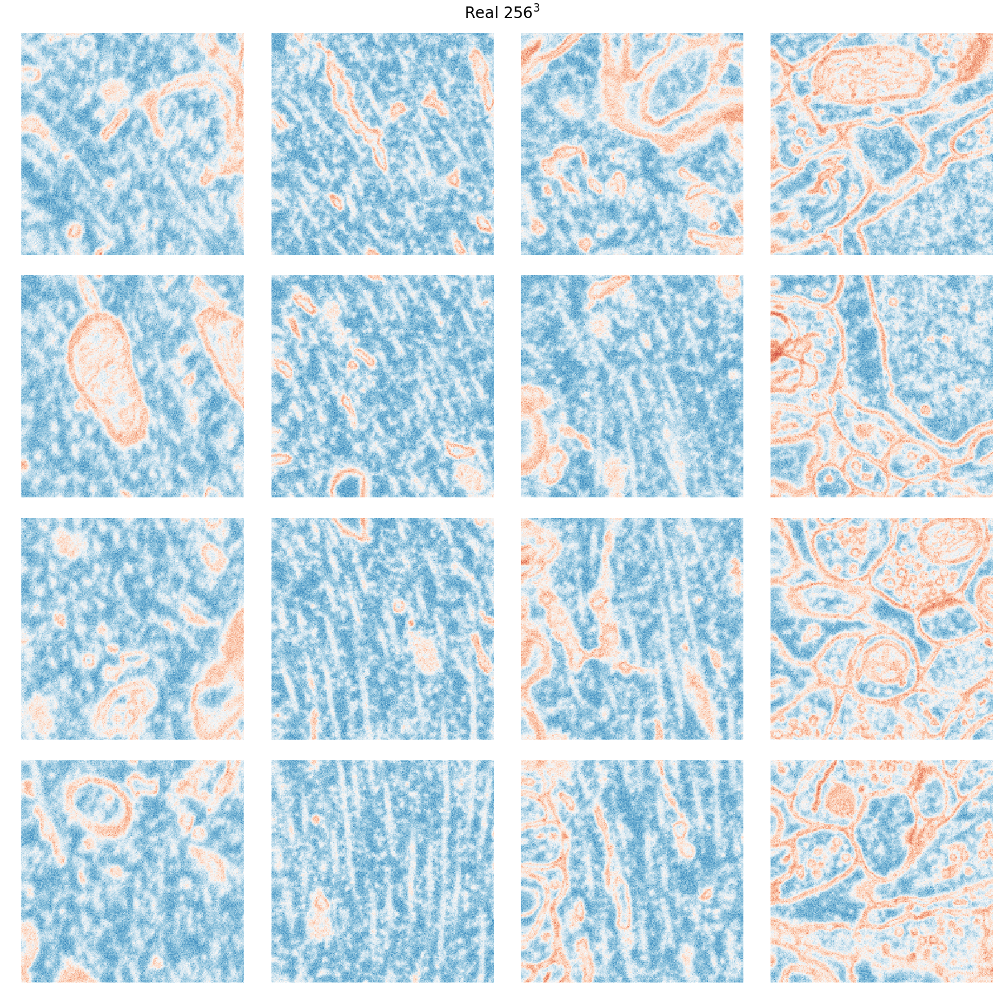

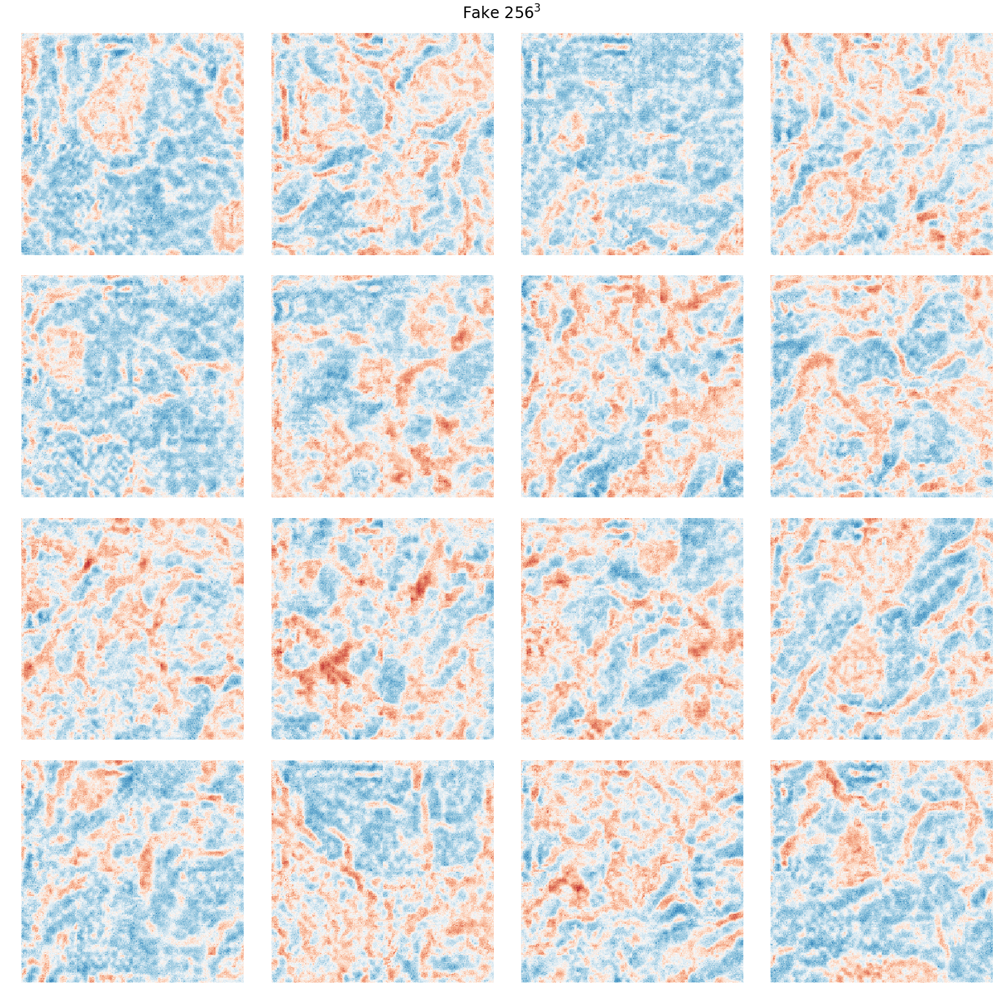

In [93]:

cmin = 0
cmax = 1
clim = (cmin, cmax)
cmap = plt.cm.RdBu
fig = plot_cubes_paper(real_samples_256, cmap=cmap, clim=clim, nx=4, ny=4);
fig.suptitle('Real $256^3$', y=1.02, fontsize=24 )
plt.savefig(pathfig+"medicalreal256.pdf", bbox_inches='tight', format='pdf')

fig2 = plot_cubes_paper(gen_samples_256[4:], cmap=cmap, clim=clim, nx=4, ny=4);
fig2.suptitle('Fake $256^3$', y=1.02, fontsize=24 )
plt.savefig(pathfig+"medicalfake256.pdf", bbox_inches='tight', format='pdf')



In [26]:
# logel2, l2, logel1, l1 = evaluation.compute_and_plot_mass_hist(real_samples_256, gen_samples_256)
# plt.savefig(pathfig+"medical256full_hist.pdf", bbox_inches='tight', format='pdf')

In [27]:
# logel2, l2, logel1, l1 = evaluation.compute_and_plot_peak_cout(real_samples_256, gen_samples_256)
# plt.savefig(pathfig+"medical256full_peak.pdf", bbox_inches='tight', format='pdf')

In [28]:
# evaluation.compute_and_plot_psd(real_samples_256, gen_samples_256)
# plt.savefig(pathfig+"medical256full_psd.pdf", bbox_inches='tight', format='pdf')

# Scale by scale analysis

## 32 cubes

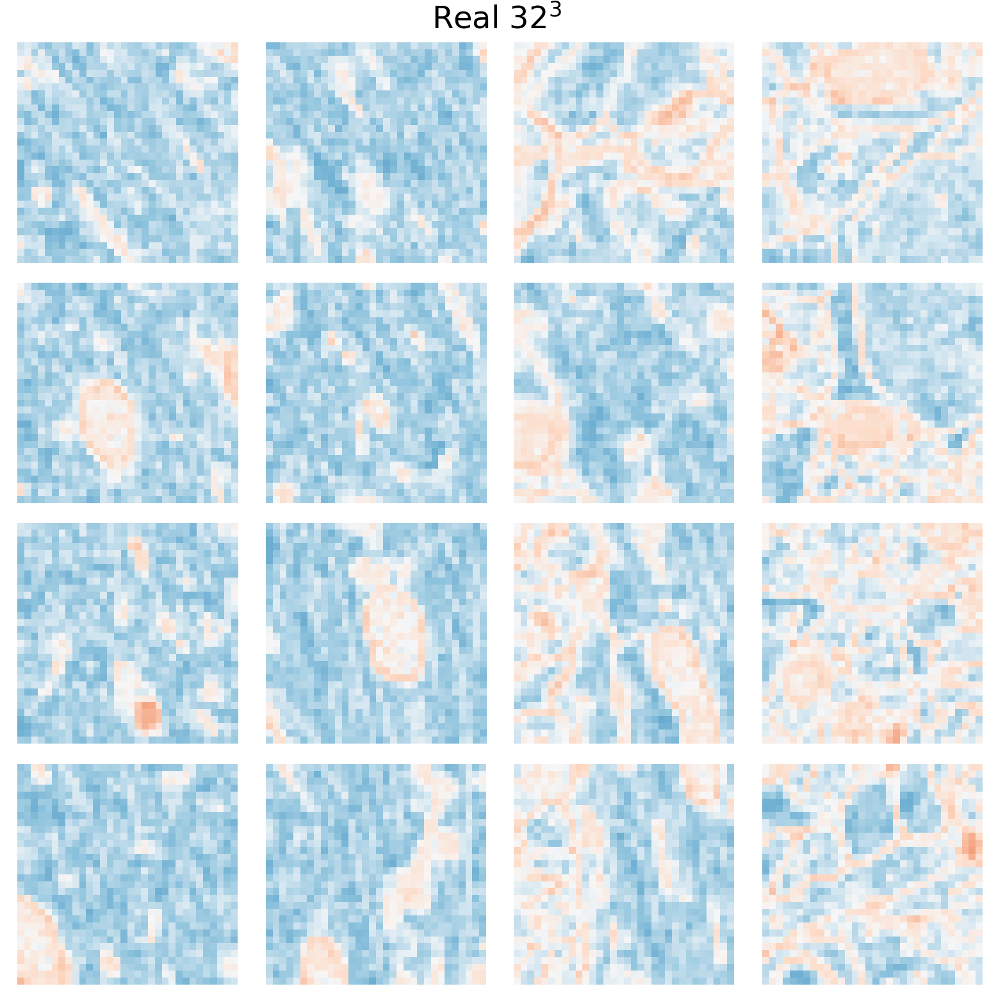

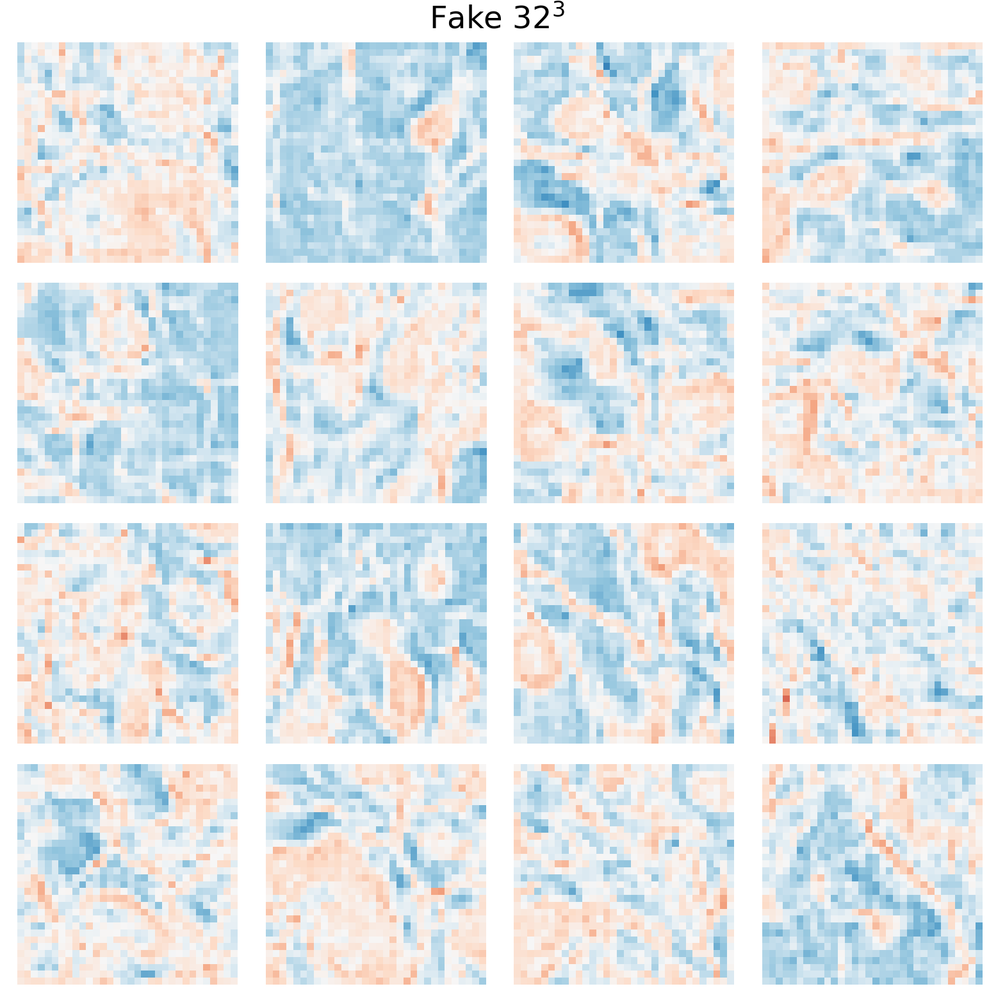

In [72]:

cmin = 0
cmax = 1
clim = (cmin, cmax)
fig = plot_cubes_paper(real_samples_32, cmap=cmap, clim=clim, nx=4, ny=4);
fig.suptitle('Real $32^3$', y=1.03, fontsize=48 )
plt.savefig(pathfig+"medicalreal32.pdf", bbox_inches='tight', format='pdf')

fig2 = plot_cubes_paper(gen_samples_32, cmap=cmap, clim=clim, nx=4, ny=4);
fig2.suptitle('Fake $32^3$', y=1.03, fontsize=48 )
plt.savefig(pathfig+"medicalfake32.pdf", bbox_inches='tight', format='pdf')



In [30]:
# logel2, l2, logel1, l1 = evaluation.compute_and_plot_mass_hist(real_samples_32, gen_samples_32)
# plt.savefig(pathfig+"medical32_hist.pdf", bbox_inches='tight', format='pdf')

In [31]:
# logel2, l2, logel1, l1 = evaluation.compute_and_plot_peak_cout(real_samples_32, gen_samples_32)
# plt.savefig(pathfig+"medical32_peak.pdf", bbox_inches='tight', format='pdf')

In [32]:
# evaluation.compute_and_plot_psd(real_samples_32, gen_samples_32)
# plt.savefig(pathfig+"medical32_psd.pdf", bbox_inches='tight', format='pdf')

## 64 Cubes

In [33]:
name = 'WGAN_32_to_64_checkpoints'
class CosmoUpscalePatchWGAN(UpscalePatchWGAN, CosmoWGAN):
    pass

pathmodel64 = os.path.join(pathmodel, name)
params_64 = utils.load_params(pathmodel64)
wgan_64 = UpcaleGANsystem(CosmoUpscalePatchWGAN, params_64)
gen_samples_64_single = wgan_64.upscale_image(small=np.reshape(real_samples_32, [*real_samples_32.shape,1]), checkpoint=checkpoint64)

Using X_down instead of X_smooth
Border block

--------------------------------------------------
     BORDER:  The input is of size (?, 32, 32, 32, 7)
     BORDER: 0 Conv layer with 64 channels
         BORDER:  Size of the conv variables: (?, 16, 16, 16, 64)
     BORDER: 1 Conv layer with 64 channels
         BORDER:  Size of the conv variables: (?, 8, 8, 8, 64)
     BORDER: 2 Conv layer with 16 channels
         BORDER:  Size of the conv variables: (?, 4, 4, 4, 16)
     BORDER:  Size of the conv variables: (?, 1024)
--------------------------------------------------

Generator 
--------------------------------------------------
     The input is of size (?, 256)
     Contenate with latent variables to (?, 1280)
     0 Full layer with 16384 outputs
         Size of the variables: (?, 16384)
     Reshape to (?, 16, 16, 16, 4)
     Contenate with latent variables to (?, 16, 16, 16, 5)
     1 Deconv layer with 64 channels
         Non linearity applied
         Size of the variables: (?

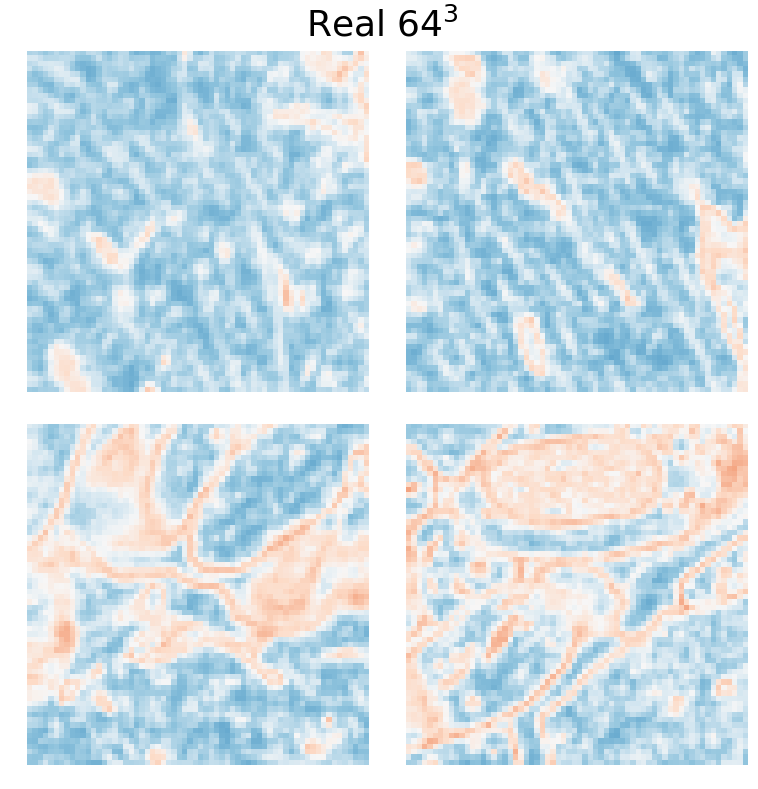

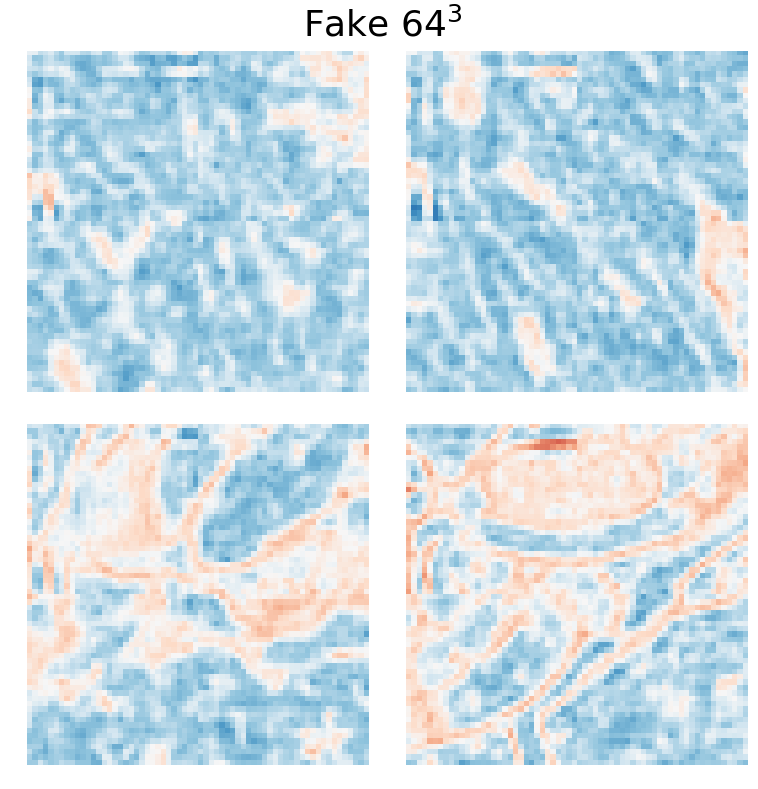

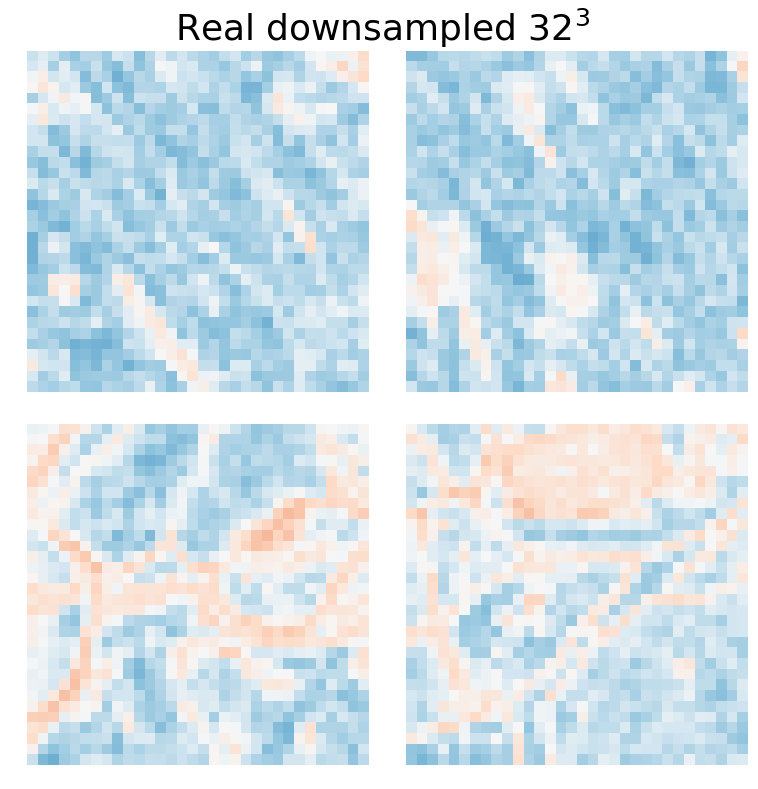

In [34]:

cmin = 0
cmax = 1
clim = (cmin, cmax)
fig = plot_cubes_paper(real_samples_64, cmap=cmap, clim=clim);
fig.suptitle('Real $64^3$', y=1.04, fontsize=36 )
plt.savefig(pathfig+"medicalup_real64.pdf", bbox_inches='tight', format='pdf')

fig2 = plot_cubes_paper(gen_samples_64_single, cmap=cmap, clim=clim);
fig2.suptitle('Fake $64^3$', y=1.04, fontsize=36 )
plt.savefig(pathfig+"medicalup_fake64.pdf", bbox_inches='tight', format='pdf')

fig = plot_cubes_paper(real_samples_32, cmap=cmap, clim=clim);
fig.suptitle('Real downsampled $32^3$', y=1.04, fontsize=36 )
plt.savefig(pathfig+"medicalup_down32.pdf", bbox_inches='tight', format='pdf')

In [35]:
# logel2, l2, logel1, l1 = evaluation.compute_and_plot_mass_hist(real_samples_64, gen_samples_64_single)
# plt.savefig(pathfig+"medicalup_64_hist.pdf", bbox_inches='tight', format='pdf')

In [36]:
# logel2, l2, logel1, l1 = evaluation.compute_and_plot_peak_cout(real_samples_64, gen_samples_64_single)
# plt.savefig(pathfig+"medicalup_64_peak.pdf", bbox_inches='tight', format='pdf')

In [37]:
# evaluation.compute_and_plot_psd(real_samples_64, gen_samples_64_single)
# plt.savefig(pathfig+"medicalup_64_psd.pdf", bbox_inches='tight', format='pdf')

## 256 Cubes

In [38]:
name = 'WGAN_64_to_256_checkpoints'
pathmodel256 = os.path.join(pathmodel, name)

params_256 = utils.load_params(pathmodel256)

wgan_256 = UpcaleGANsystem(CosmoUpscalePatchWGAN, params_256)
gen_samples_single_256 = wgan_256.upscale_image(small=np.reshape(real_samples_64, [*real_samples_64.shape, 1]), checkpoint=checkpoint256)

Using X_down instead of X_smooth
Border block

--------------------------------------------------
     BORDER:  The input is of size (?, 32, 32, 32, 7)
     BORDER: 0 Conv layer with 64 channels
         BORDER:  Size of the conv variables: (?, 16, 16, 16, 64)
     BORDER: 1 Conv layer with 64 channels
         BORDER:  Size of the conv variables: (?, 8, 8, 8, 64)
     BORDER: 2 Conv layer with 16 channels
         BORDER:  Size of the conv variables: (?, 4, 4, 4, 16)
     BORDER:  Size of the conv variables: (?, 1024)
--------------------------------------------------

Generator 
--------------------------------------------------
     The input is of size (?, 256)
     Contenate with latent variables to (?, 1280)
     0 Full layer with 4096 outputs
         Size of the variables: (?, 4096)
     Reshape to (?, 8, 8, 8, 8)
     Contenate with latent variables to (?, 8, 8, 8, 9)
     1 Deconv layer with 256 channels
         Non linearity applied
         Size of the variables: (?, 16, 1

Current patch: column=7, row=2, height=1

Sampling z
Not loading a checkpoint
Current patch: column=8, row=2, height=1

Sampling z
Not loading a checkpoint
Current patch: column=1, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=2, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=3, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=4, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=5, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=6, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=7, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=8, row=3, height=1

Sampling z
Not loading a checkpoint
Current patch: column=1, row=4, height=1

Sampling z
Not loading a checkpoint
Current patch: column=2, row=4, height=1

Sampling z
Not loading a checkpoint
Current patch: column=3, row=4, height=1

Sampling z
Not loading

Current patch: column=1, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=2, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=3, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=4, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=5, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=6, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=7, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=8, row=8, height=2

Sampling z
Not loading a checkpoint
Current patch: column=1, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=2, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=3, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=4, row=1, height=3

Sampling z
Not loading a checkpoint
Current patch: column=5, row=1, height=3

Sampling z
Not loading

Current patch: column=3, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=4, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=5, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=6, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=7, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=8, row=5, height=4

Sampling z
Not loading a checkpoint
Current patch: column=1, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=2, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=3, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=4, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=5, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=6, row=6, height=4

Sampling z
Not loading a checkpoint
Current patch: column=7, row=6, height=4

Sampling z
Not loading

Current patch: column=5, row=2, height=6

Sampling z
Not loading a checkpoint
Current patch: column=6, row=2, height=6

Sampling z
Not loading a checkpoint
Current patch: column=7, row=2, height=6

Sampling z
Not loading a checkpoint
Current patch: column=8, row=2, height=6

Sampling z
Not loading a checkpoint
Current patch: column=1, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=2, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=3, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=4, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=5, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=6, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=7, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=8, row=3, height=6

Sampling z
Not loading a checkpoint
Current patch: column=1, row=4, height=6

Sampling z
Not loading

Current patch: column=7, row=7, height=7

Sampling z
Not loading a checkpoint
Current patch: column=8, row=7, height=7

Sampling z
Not loading a checkpoint
Current patch: column=1, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=2, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=3, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=4, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=5, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=6, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=7, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=8, row=8, height=7

Sampling z
Not loading a checkpoint
Current patch: column=1, row=1, height=8

Sampling z
Not loading a checkpoint
Current patch: column=2, row=1, height=8

Sampling z
Not loading a checkpoint
Current patch: column=3, row=1, height=8

Sampling z
Not loading

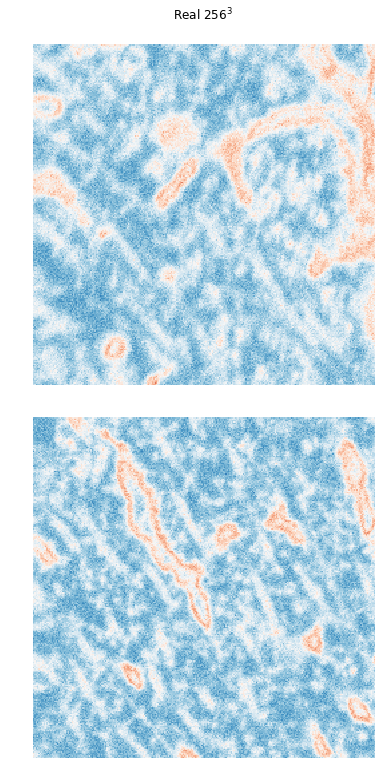

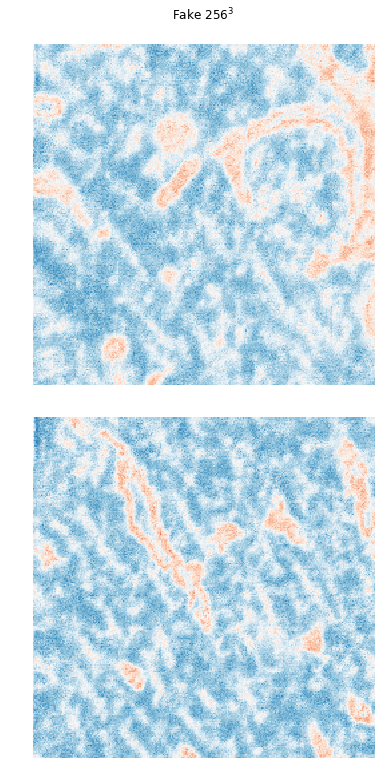

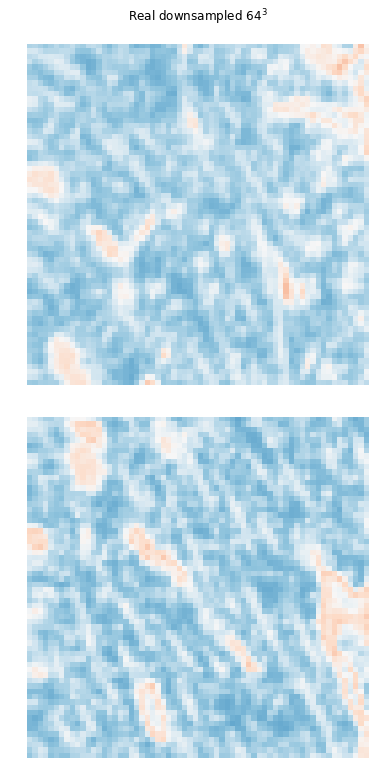

In [39]:

cmin = 0
cmax = 1
clim = (cmin, cmax)
fig = plot_cubes_paper(real_samples_256, cmap=cmap, clim=clim, ny=1);
fig.suptitle('Real $256^3$', y=1.03, fontsize=12 )
plt.savefig(pathfig+"medicalup_real256.pdf", bbox_inches='tight', format='pdf')

fig2 = plot_cubes_paper(gen_samples_single_256, cmap=cmap, clim=clim, ny=1);
fig2.suptitle('Fake $256^3$', y=1.03, fontsize=12 )
plt.savefig(pathfig+"medicalup_fake256.pdf", bbox_inches='tight', format='pdf')

fig = plot_cubes_paper(real_samples_64, cmap=cmap, clim=clim, ny=1);
fig.suptitle('Real downsampled $64^3$', y=1.03, fontsize=12 )
plt.savefig(pathfig+"medicalup_down64.pdf", bbox_inches='tight', format='pdf')

In [40]:
# logel2, l2, logel1, l1 = evaluation.compute_and_plot_mass_hist(real_samples_256, gen_samples_single_256)
# plt.savefig(pathfig+"medicalup_256_hist.pdf", bbox_inches='tight', format='pdf')

In [41]:
# logel2, l2, logel1, l1 = evaluation.compute_and_plot_peak_cout(real_samples_256, gen_samples_single_256)
# plt.savefig(pathfig+"medicalup_256_peak.pdf", bbox_inches='tight', format='pdf')

In [42]:
# evaluation.compute_and_plot_psd(real_samples_256, gen_samples_single_256)
# plt.savefig(pathfig+"medicalup_256_psd.pdf", bbox_inches='tight', format='pdf')

## Uniscale

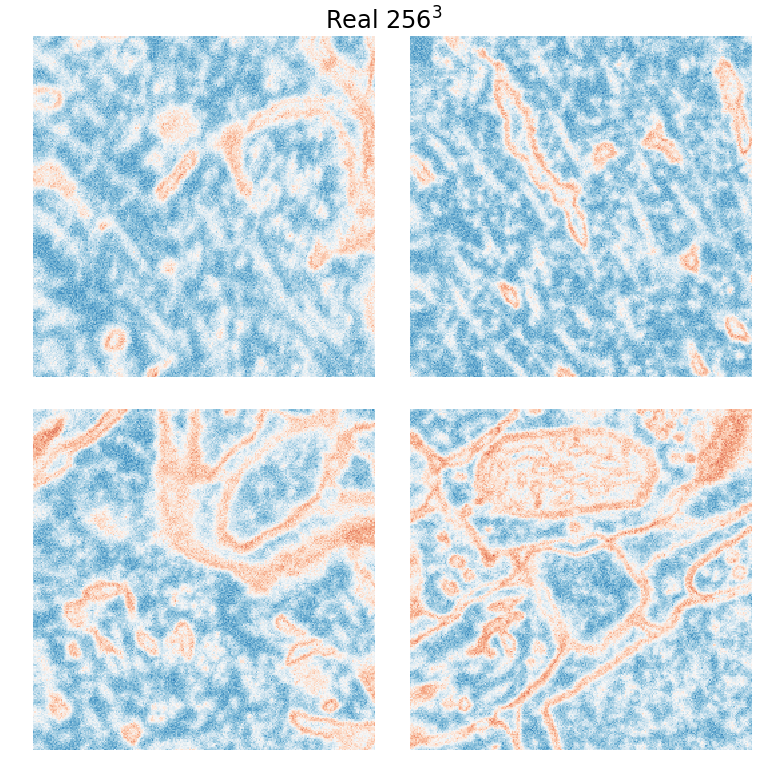

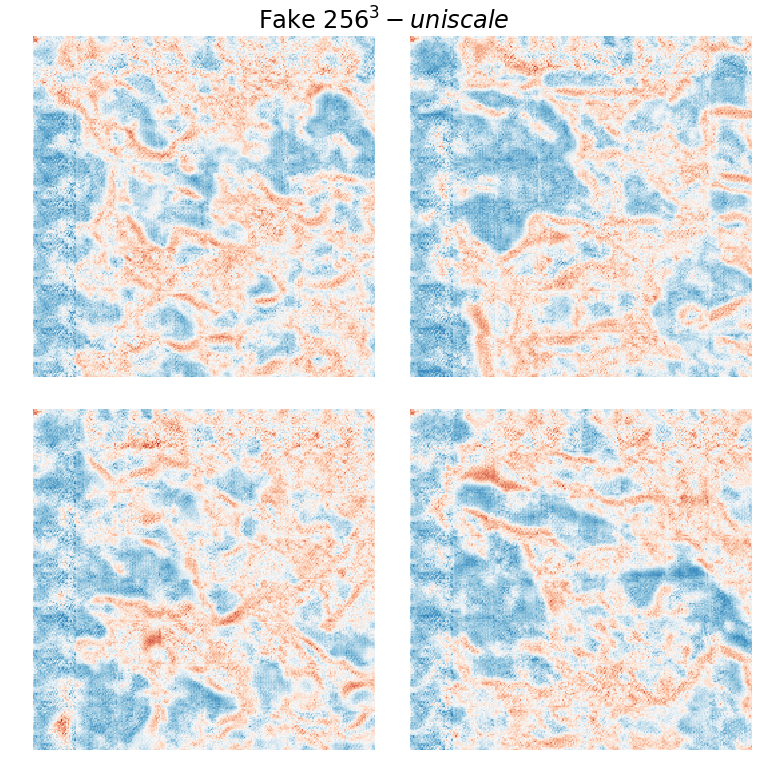

In [43]:
cmin = 0
cmax = 1
clim = (cmin, cmax)
fig = plot_cubes_paper(real_samples_256, cmap=cmap, clim=clim);
fig.suptitle('Real $256^3$', y=1.02, fontsize=24 )
plt.savefig(pathfig+"medicaluniscalereal256.pdf", bbox_inches='tight', format='pdf')

fig2 = plot_cubes_paper(gen_samples_uniscale, cmap=cmap, clim=clim);
fig2.suptitle('Fake $256^3 - uniscale$', y=1.02, fontsize=24 )
plt.savefig(pathfig+"medicaluniscalefake256.pdf", bbox_inches='tight', format='pdf')

Log l2 Mass histogram loss: 46.0154043272187
L2 Peak Mass histogram: 703386493220.6217
Log l1 Mass histogram loss: 2.1619875144643133
L1 Mass histogram loss: 278294.825


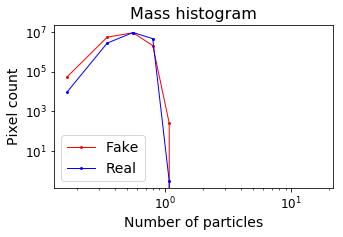

In [45]:
logel2, l2, logel1, l1 = evaluation.compute_and_plot_mass_hist(real_samples_256, gen_samples_uniscale)
plt.savefig(pathfig+"medical256uniscale_hist.pdf", bbox_inches='tight', format='pdf')

Log l2 Peak Count loss: 79.71116816853146
L2 Peak Count loss: 23007105.851269532
Log l1 Peak Count loss: 6.577330797403486
L1 Peak Count loss: 2502.646875


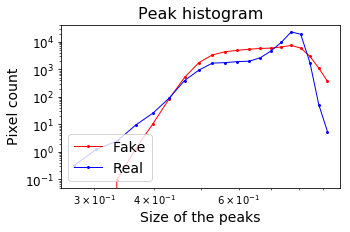

In [46]:
logel2, l2, logel1, l1 = evaluation.compute_and_plot_peak_cout(real_samples_256, gen_samples_uniscale)
plt.savefig(pathfig+"medical256uniscale_peak.pdf", bbox_inches='tight', format='pdf')

Log l2 PSD loss: 1.8552872140463814
L2 PSD loss: 9637.38295816111
Log l1 PSD loss: 1.1236942862584949
L1 PSD loss: 26.08499692117611


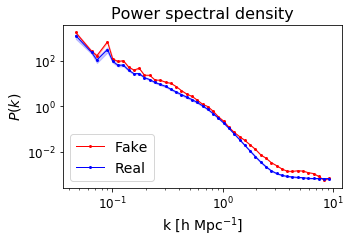

In [47]:
evaluation.compute_and_plot_psd(real_samples_256, gen_samples_uniscale)
plt.savefig(pathfig+"medical256uniscale_psd.pdf", bbox_inches='tight', format='pdf')

# Sample diversity

In [94]:
name = 'WGAN_0_to_32_checkpoints'
checkpoint = None

pathmodel32 = os.path.join(pathmodel, name)
params_32 = utils.load_params(pathmodel32)
wgan_32 = GANsystem(CosmoWGAN,params_32, name='wgan')

Generator 
--------------------------------------------------
     The input is of size (?, 100)
     0 Full layer with 32768 outputs
         Size of the variables: (?, 32768)
     Reshape to (?, 4, 4, 4, 512)
     1 Deconv layer with 256 channels
         Non linearity applied
         Size of the variables: (?, 8, 8, 8, 256)
     2 Deconv layer with 128 channels
         Non linearity applied
         Size of the variables: (?, 16, 16, 16, 128)
     3 Deconv layer with 64 channels
         Non linearity applied
         Size of the variables: (?, 32, 32, 32, 64)
     4 Deconv layer with 64 channels
         Non linearity applied
         Size of the variables: (?, 32, 32, 32, 64)
     5 Deconv layer with 1 channels
         Size of the variables: (?, 32, 32, 32, 1)
     The output is of size (?, 32, 32, 32, 1)
--------------------------------------------------

Discriminator 
--------------------------------------------------
     The input is of size (?, 32, 32, 32, 1)
Warning spec

In [95]:
num_div = 64
gen_samples_32 = wgan_32.generate(N=num_div, checkpoint=checkpoint)
gen_samples_32 = np.squeeze(gen_samples_32)

Sampling z
 [*] Reading checkpoints...
INFO:tensorflow:Restoring parameters from ../saved_results/medical/WGAN_0_to_32_checkpoints/wgan-47000
Checkpoint succesfully loaded!


In [96]:
os.makedirs(os.path.join(pathsample,'0_32/'), exist_ok=True)
utils.save_hdf5(gen_samples_32, os.path.join(pathsample,'0_32/32_samples_ckpt_latest_diversity.h5'))

Text(0.5,1,'Real')

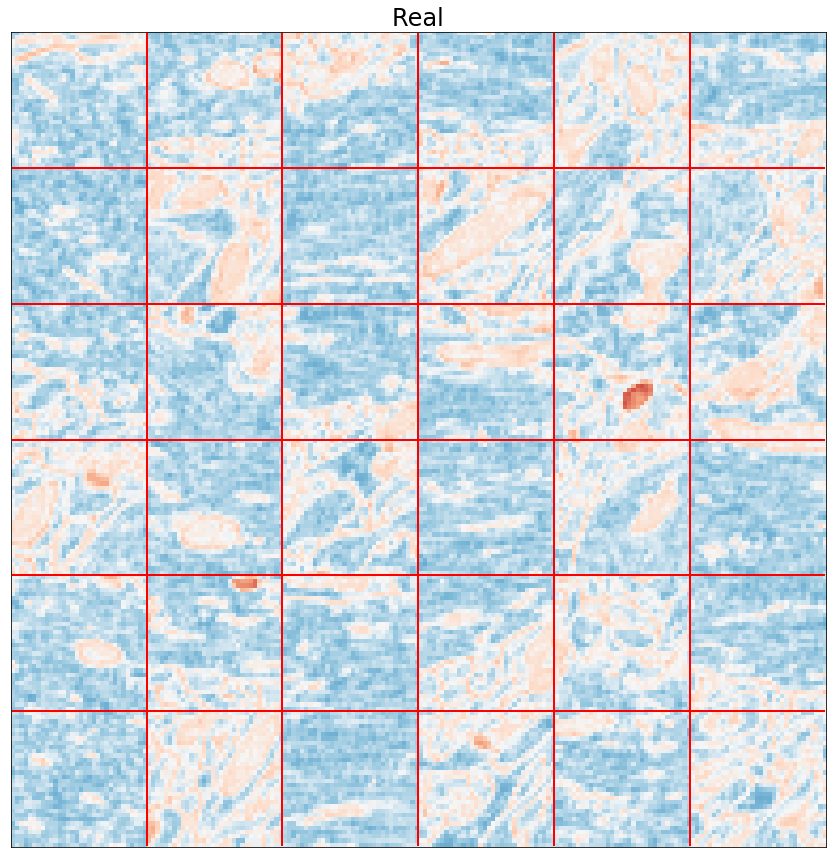

In [97]:
frame = 16
imgs = real_samples_32[:,:,:,frame]
clim = (0, 1)
plt.figure(figsize=(15, 15))
plot.draw_images(imgs, nx=6, ny=6, clim=clim, cmap=cmap)
plt.title('Real', FontSize=24)

Text(0.5,1,'Fake')

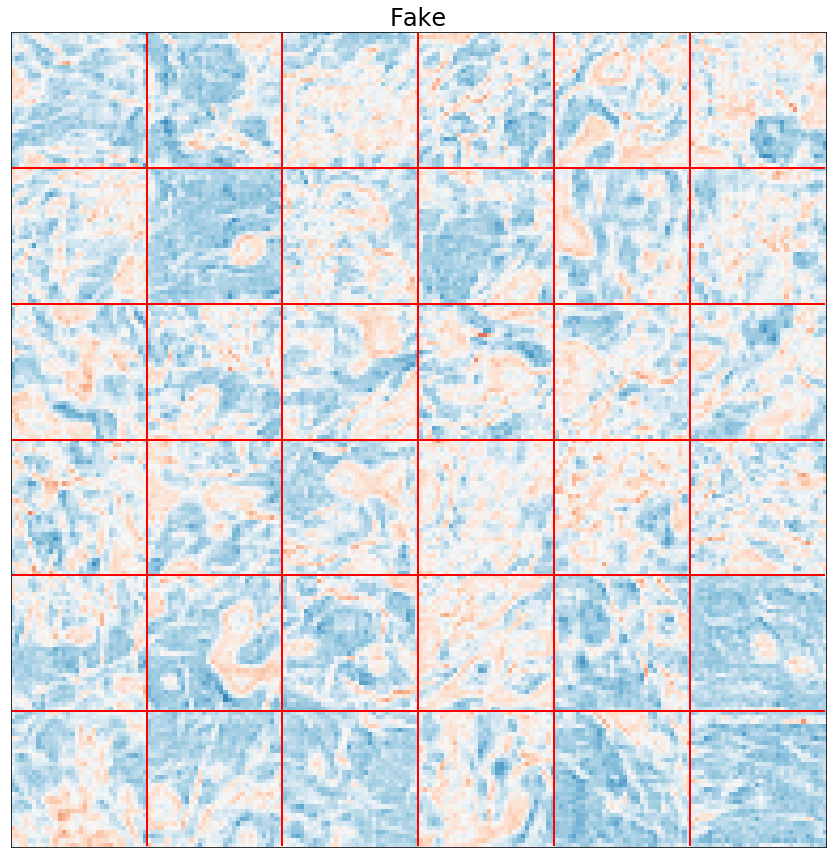

In [98]:
frame = 16
imgs = gen_samples_32[:,:,:,frame]
plt.figure(figsize=(15, 15))
plot.draw_images(imgs, nx=6, ny=6, clim=clim, cmap=cmap)
plt.title('Fake', FontSize=24)

# Gifs

## Real 256 cubes

In [ ]:
# fps=16
# clim = (0,3)
# plot.animate_cubes(real_samples_256, output_name=pathfig+"real256.gif", clim=clim, fps=fps, cmap=plt.cm.plasma)
# animation = plot.cubes_to_animation(real_samples_256, cmap=plt.cm.plasma, clim=clim)
# animation.ipython_display(fps=16, loop=True, autoplay=True)


In [ ]:
# plot.save_animation(real_samples_256[0], gen_samples_256[0], figsize=(10, 6), fps=16, format='mp4', output_file_name=pathfig+'final.mp4', clim=clim)
# plt.style.use('ggplot')